# Image Size 분석
- 이미지 크기
- 이미지 비율

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import random
import json
import cv2
from PIL import Image, ImageOps
from collections import Counter

# Train Image

In [4]:
img_list = glob.glob('/data/ephemeral/home/datasets/images/train/*.jpg')
len(img_list)
img_list.sort()

In [6]:
width_list = []
height_list = []
wh_rate_list = []

for img_path in img_list:
    img = Image.open(img_path)
    img = ImageOps.exif_transpose(img) # 이미지 회전을 원상복구
    width = img.size[0]
    height = img.size[1]
    wh_rate = height/width
    width_list.append(width)
    height_list.append(height)
    wh_rate_list.append(wh_rate)

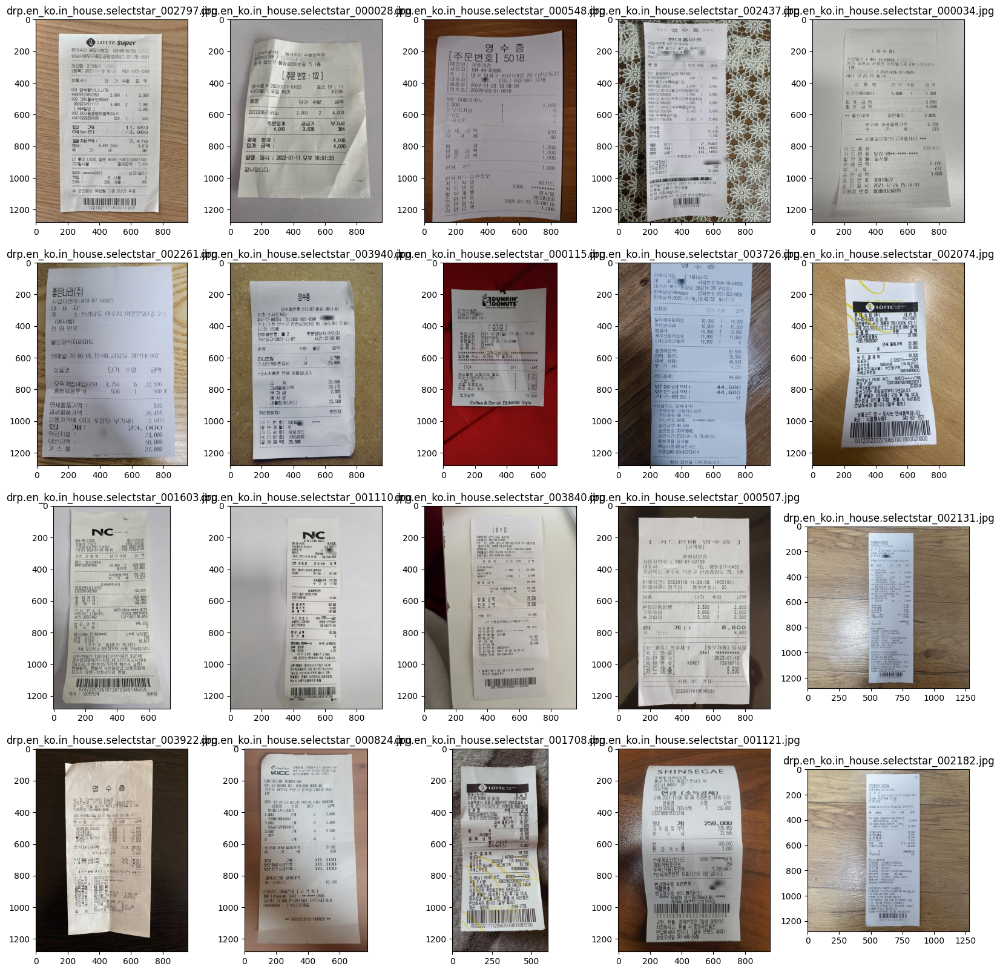

In [7]:
random.shuffle(img_list) # 매번 랜덤한 이미지 출력을 위해 셔플
plt.figure(figsize=(20, 20))

for i in range(20):
    ax = plt.subplot(4, 5, i+1)
    img_name = img_list[i].split('/')[-1]
    img = Image.open(img_list[i])
    img = ImageOps.exif_transpose(img) # 이미지 회전을 원상복구
    plt.title(img_name)
    plt.imshow(img)

### width

In [8]:
counter = Counter(width_list)
counter

Counter({960: 1830,
         720: 350,
         1280: 213,
         622: 53,
         959: 38,
         576: 37,
         605: 26,
         591: 12,
         597: 10,
         609: 8,
         660: 6,
         662: 6,
         675: 5,
         656: 5,
         588: 5,
         436: 5,
         827: 5,
         474: 5,
         719: 5,
         663: 4,
         937: 4,
         688: 4,
         550: 4,
         958: 4,
         721: 4,
         431: 4,
         715: 4,
         665: 4,
         521: 4,
         633: 4,
         646: 3,
         590: 3,
         623: 3,
         603: 3,
         488: 3,
         738: 3,
         667: 3,
         516: 3,
         961: 3,
         821: 3,
         626: 3,
         774: 3,
         530: 3,
         727: 3,
         473: 3,
         451: 3,
         598: 3,
         652: 3,
         512: 3,
         607: 3,
         750: 3,
         389: 3,
         895: 3,
         753: 3,
         589: 3,
         831: 3,
         651: 3,
         830: 3,


### height

In [9]:
counter = Counter(height_list)
counter

Counter({1280: 3259,
         1279: 5,
         960: 3,
         1147: 1,
         1088: 1,
         938: 1,
         1202: 1,
         959: 1})

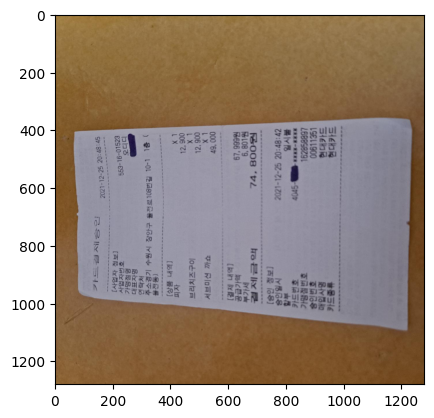

In [10]:
img = Image.open('/data/ephemeral/home/datasets/images/train/drp.en_ko.in_house.selectstar_000724.jpg')
plt.imshow(img)

## polygon 표현

In [11]:
with open('/data/ephemeral/home/datasets/jsons/train.json', 'r') as train_json:
    data = json.load(train_json)
    words = data['images']["drp.en_ko.in_house.selectstar_000724.jpg"]['words']
    for word_id, word_data in words.items():
        points = word_data.get('points', [])
        print(points)

[[320.07, 129.59], [580.26, 129.59], [580.26, 157.21], [320.07, 157.21]]
[[639.43, 155.05], [754.16, 145.33], [755.71, 167.11], [640.59, 176.06]]
[[761.93, 146.11], [856.44, 136.39], [858.39, 156.61], [763.1, 167.5]]
[[316.1, 175.11], [599.17, 183.67], [857.27, 165.13], [857.99, 176.53], [597.74, 194.36], [314.67, 184.38]]
[[318.83, 194.75], [395.59, 194.75], [395.59, 218.15], [318.83, 218.15]]
[[405.65, 197.51], [460.26, 197.51], [460.26, 218.9], [405.65, 218.9]]
[[312.89, 219.12], [426.89, 219.12], [426.89, 240.26], [312.89, 240.26]]
[[719.13, 217.72], [857.35, 203.24], [860.64, 225.28], [721.43, 239.76]]
[[310.98, 241.01], [400.28, 241.01], [400.28, 262.4], [310.98, 262.4]]
[[789.13, 235.42], [857.05, 226.59], [858.92, 250.39], [788.33, 257.34]]
[[308.8, 263.31], [399.89, 263.31], [399.89, 286.71], [308.8, 286.71]]
[[307.53, 286.46], [374.98, 286.46], [374.98, 310.87], [307.53, 310.87]]
[[305.37, 311.94], [396.64, 311.94], [396.64, 335.04], [305.37, 335.04]]
[[409.75, 311.94], [476.

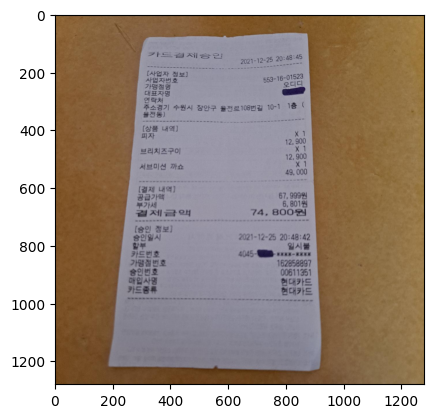

In [12]:
img = cv2.imread(os.path.join('/data/ephemeral/home/datasets/images/train', 'drp.en_ko.in_house.selectstar_000724.jpg'))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [13]:
points

[[331.44, 940.3], [355.0, 940.3], [355.0, 968.62], [331.44, 968.62]]

{'0001': {'points': [[235.83, 91.13], [430.55, 108.13], [433.64, 133.37], [235.83, 119.46]], 'orientation': 'Horizontal', 'language': ['ko']}, '0002': {'points': [[457.34, 113.79], [468.67, 113.79], [468.67, 130.79], [457.34, 130.79]], 'orientation': 'Horizontal', 'language': None}, '0003': {'points': [[493.91, 114.83], [550.43, 119.49], [551.09, 143.67], [493.24, 140.34]], 'orientation': 'Horizontal', 'language': None}, '0004': {'points': [[232.74, 118.95], [345.55, 125.13], [346.58, 149.85], [233.25, 144.7]], 'orientation': 'Horizontal', 'language': ['ko']}, '0005': {'points': [[233.79, 145.49], [370.86, 155.73], [371.15, 178.76], [234.36, 171.65]], 'orientation': 'Horizontal', 'language': None}, '0006': {'points': [[379.68, 156.86], [419.21, 160.2], [419.21, 181.32], [379.68, 181.32]], 'orientation': 'Horizontal', 'language': ['en']}, '0007': {'points': [[233.22, 173.36], [326.21, 177.63], [326.21, 201.8], [233.5, 198.38]], 'orientation': 'Horizontal', 'language': ['ko']}, '0008': {

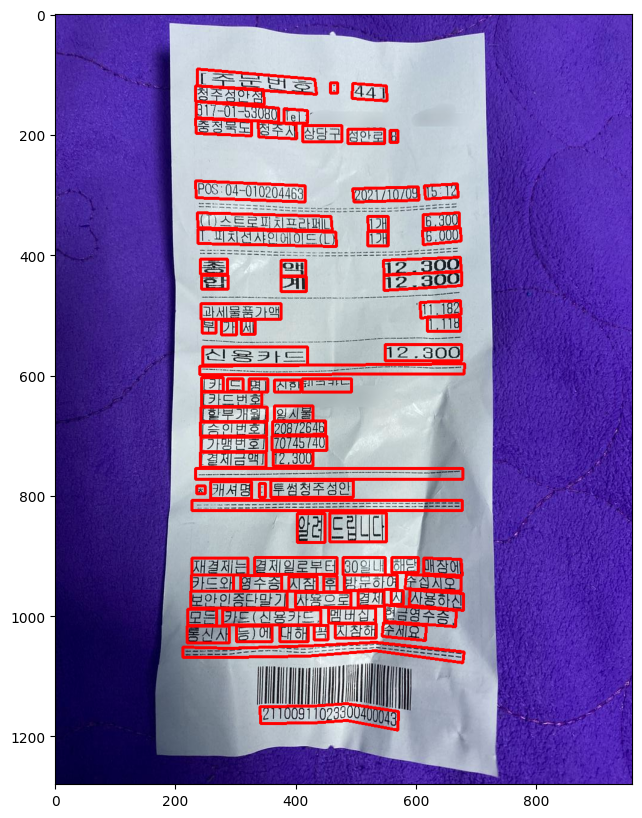

In [8]:
img = cv2.imread('/data/ephemeral/home/datasets/images/train/drp.en_ko.in_house.selectstar_000003.jpg')

with open('/data/ephemeral/home/datasets/jsons/train.json', 'r') as train_json:
    data = json.load(train_json)
    words = data['images']['drp.en_ko.in_house.selectstar_000003.jpg']['words']
    print(words)
    for word_id, word_data in words.items():
        points = word_data.get('points', [])
        points = np.array(points)
        points = np.round(points).astype(np.int32)
        points = points.reshape((-1, 2))
        cv2.polylines(img, [points], isClosed=True, color=(255, 0, 0), thickness=3)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

In [2]:
def print_bbox(img_path):
    font = cv2.FONT_HERSHEY_SIMPLEX
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_name = img_path.split('/')[-1]
    with open('/data/ephemeral/home/datasets/jsons/train_v2.json', 'r') as train_json:
        data = json.load(train_json)
        words = data['images'][img_name]['words']
        for word_id, word_data in words.items():
            points = np.array(word_data.get('points', []))
            points = np.round(points).astype(np.int32).reshape((-1, 2))
            cv2.polylines(img, [points], isClosed=True, color=(255, 0, 0), thickness=3)
            cv2.putText(img, f'{int(word_id)}', (points[0][0], points[0][1]-10), font, 0.5, (255, 0, 0), 2)

    plt.figure(figsize=(10, 10))
    plt.title(img_name)
    plt.imshow(img)
    plt.show()

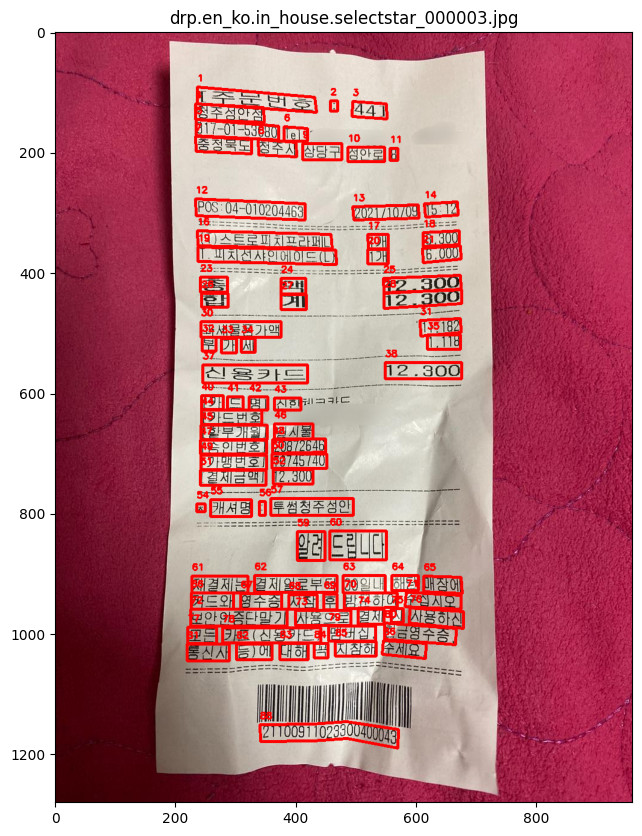

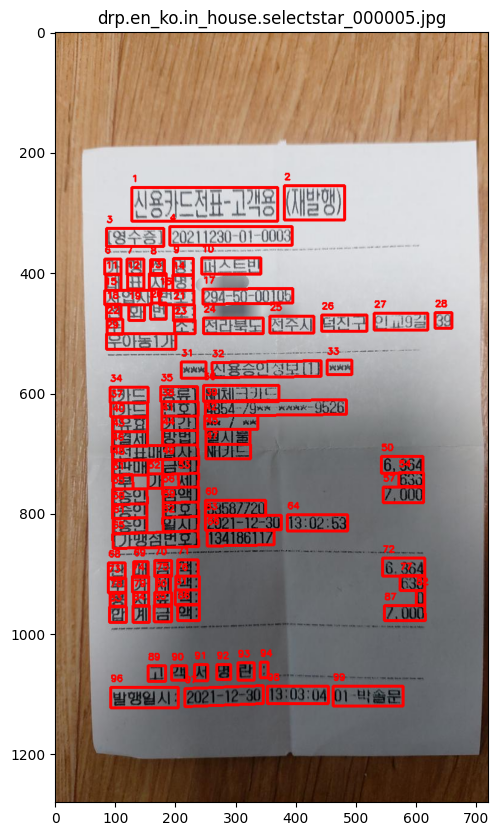

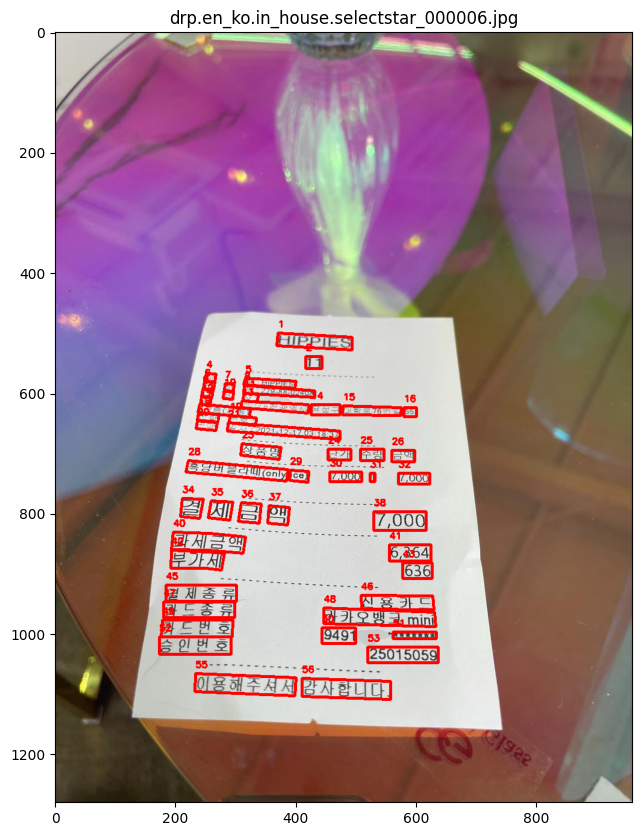

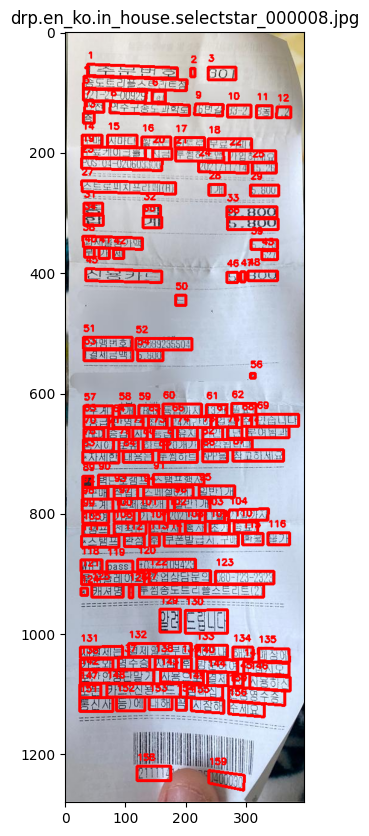

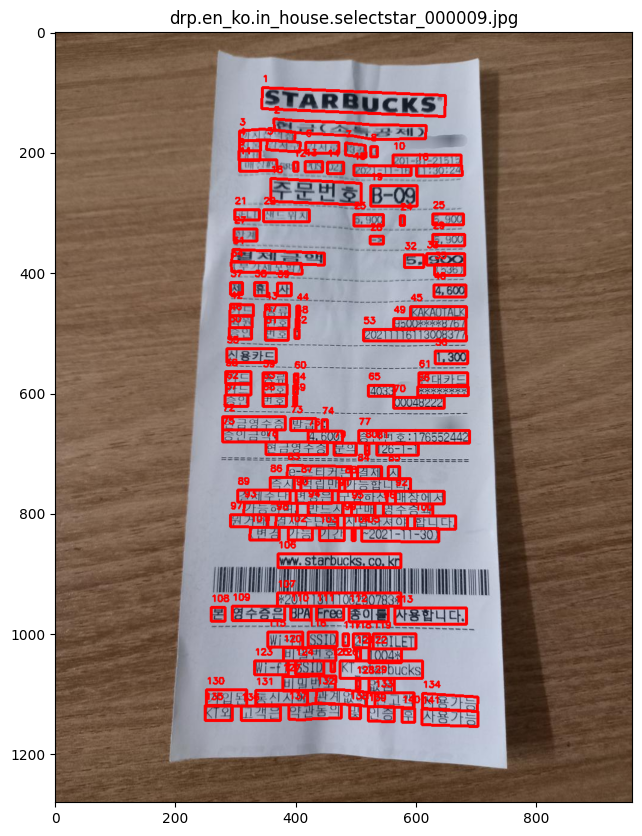

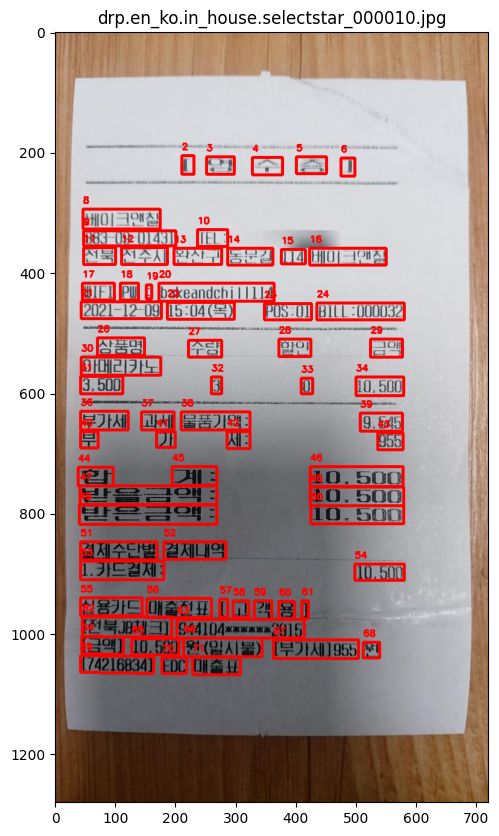

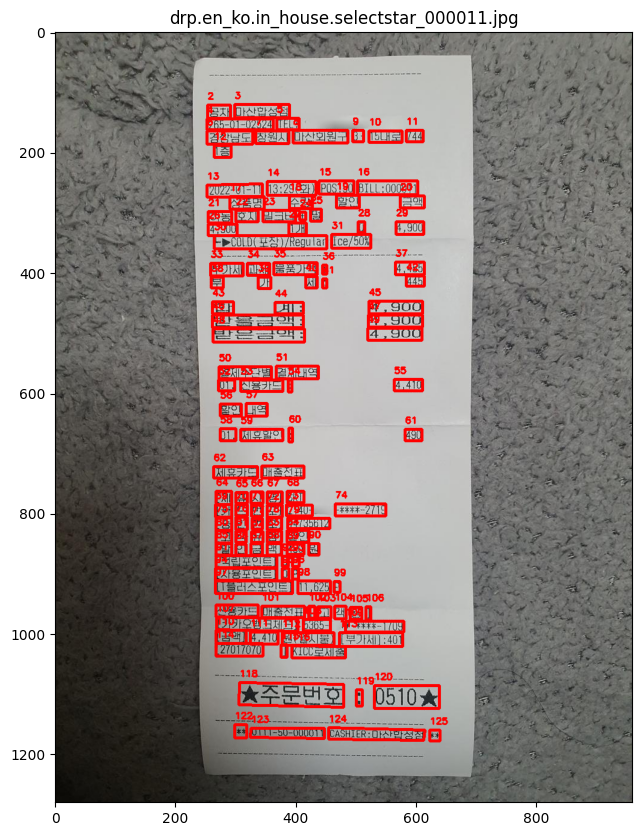

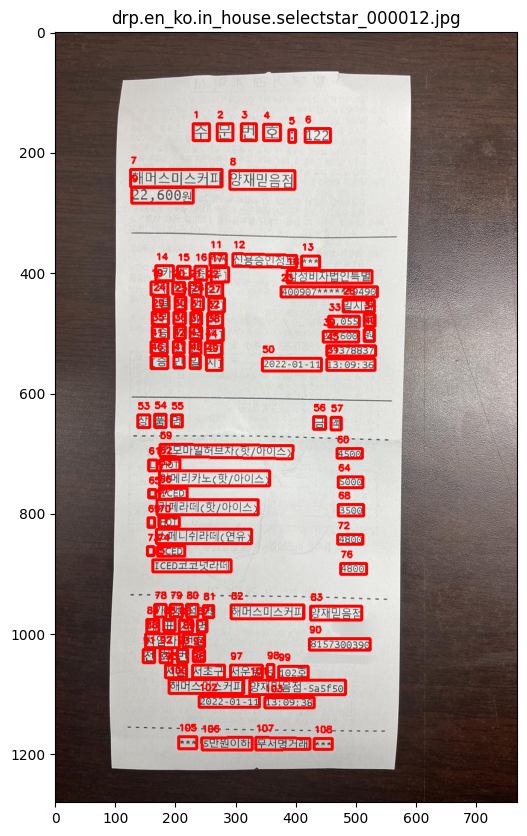

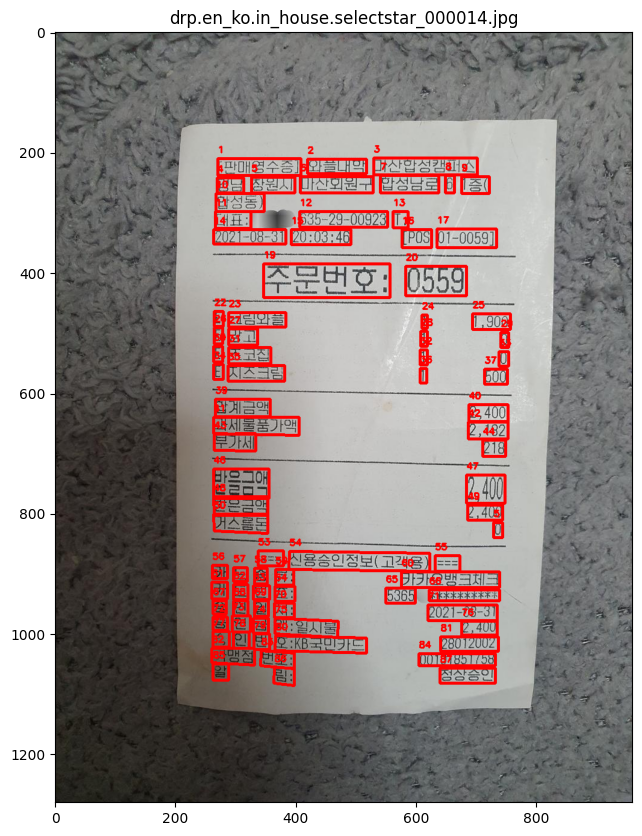

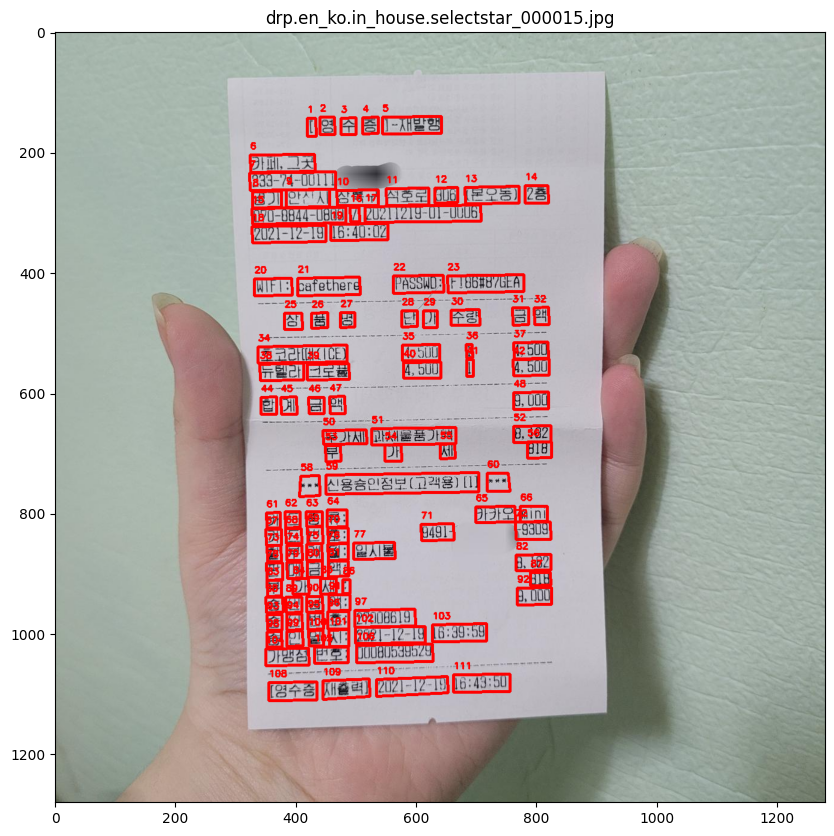

In [5]:
for i in range(10):
    print_bbox(img_list[i])

# Val Image

In [30]:
val_img_list = glob.glob('/data/ephemeral/home/datasets/images/val/*.jpg')
len(val_img_list)

404

In [31]:
val_width_list = []
val_height_list = []
val_wh_rate_list = []

for img_path in val_img_list:
    img = Image.open(img_path)
    img = ImageOps.exif_transpose(img) # 이미지 회전을 원상복구
    width = img.size[0]
    height = img.size[1]
    wh_rate = height/width
    val_width_list.append(width)
    val_height_list.append(height)
    val_wh_rate_list.append(wh_rate)

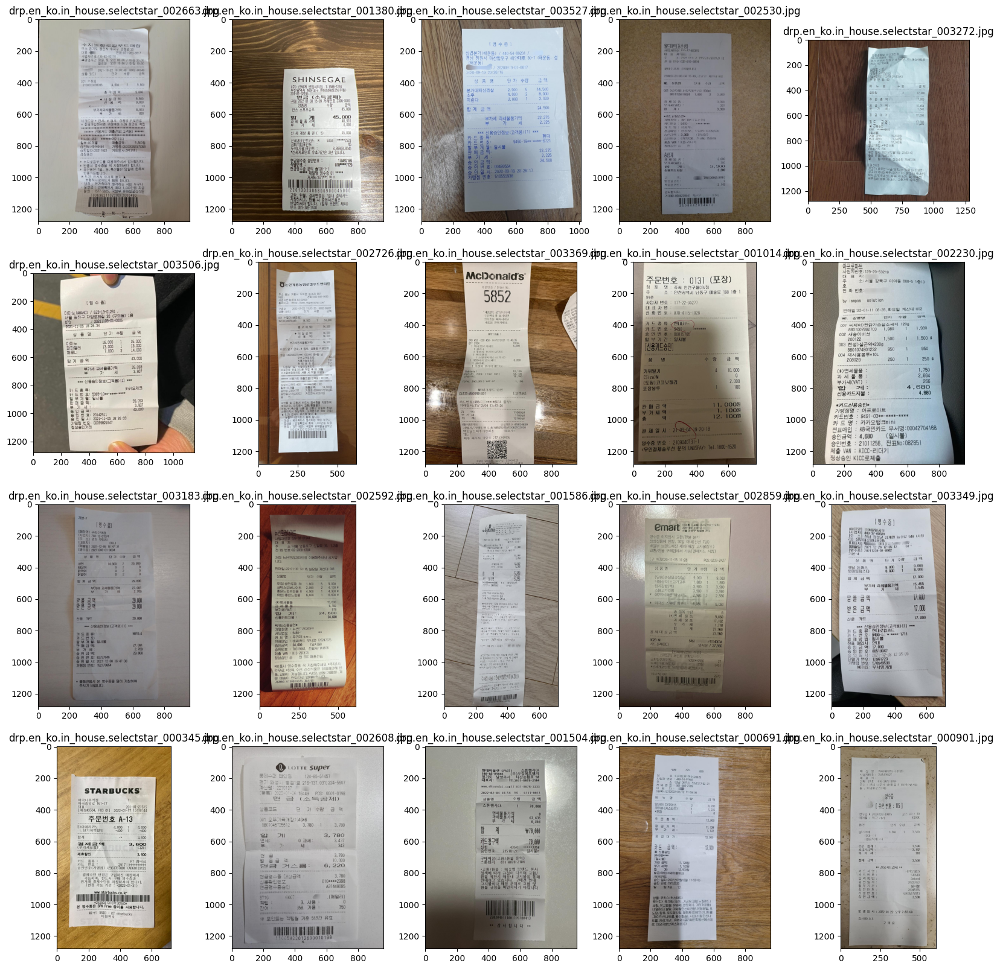

In [32]:
random.shuffle(val_img_list) # 매번 랜덤한 이미지 출력을 위해 셔플
plt.figure(figsize=(20, 20))

for i in range(20):
    ax = plt.subplot(4, 5, i+1)
    img_name = val_img_list[i].split('/')[-1]
    img = Image.open(val_img_list[i])
    img = ImageOps.exif_transpose(img) # 이미지 회전을 원상복구
    plt.imshow(img)
    plt.title(img_name)

In [33]:
w_counter = Counter(width_list)
print(w_counter)
h_counter = Counter(height_list)
print(h_counter)

Counter({960: 1830, 720: 350, 1280: 213, 622: 53, 959: 38, 576: 37, 605: 26, 591: 12, 597: 10, 609: 8, 662: 6, 660: 6, 719: 5, 675: 5, 827: 5, 656: 5, 588: 5, 436: 5, 474: 5, 715: 4, 937: 4, 665: 4, 633: 4, 721: 4, 550: 4, 958: 4, 431: 4, 688: 4, 663: 4, 521: 4, 793: 3, 679: 3, 389: 3, 557: 3, 740: 3, 938: 3, 652: 3, 667: 3, 895: 3, 607: 3, 538: 3, 590: 3, 738: 3, 727: 3, 902: 3, 651: 3, 514: 3, 682: 3, 473: 3, 512: 3, 603: 3, 620: 3, 624: 3, 488: 3, 628: 3, 774: 3, 626: 3, 821: 3, 516: 3, 623: 3, 831: 3, 750: 3, 598: 3, 646: 3, 451: 3, 753: 3, 520: 3, 592: 3, 589: 3, 530: 3, 552: 3, 747: 3, 961: 3, 830: 3, 741: 2, 700: 2, 692: 2, 654: 2, 519: 2, 505: 2, 429: 2, 536: 2, 506: 2, 716: 2, 492: 2, 524: 2, 661: 2, 729: 2, 655: 2, 695: 2, 635: 2, 916: 2, 887: 2, 712: 2, 631: 2, 503: 2, 742: 2, 803: 2, 560: 2, 476: 2, 617: 2, 600: 2, 746: 2, 345: 2, 717: 2, 448: 2, 574: 2, 565: 2, 767: 2, 647: 2, 399: 2, 672: 2, 507: 2, 877: 2, 578: 2, 479: 2, 905: 2, 668: 2, 797: 2, 573: 2, 566: 2, 526: 2, 9

In [34]:
def val_print_bbox(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_name = img_path.split('/')[-1]
    with open('/data/ephemeral/home/datasets/jsons/val.json', 'r') as train_json:
        data = json.load(train_json)
        words = data['images'][img_name]['words']
        for word_id, word_data in words.items():
            points = word_data.get('points', [])
            x = int(points[0][0])
            y = int(points[0][1])
            w = int(points[1][0] - points[0][0])
            h = int(points[2][1] - points[1][1])
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 1)

    plt.figure(figsize=(10, 10))
    plt.title(img_name)
    plt.imshow(img)
    plt.show()

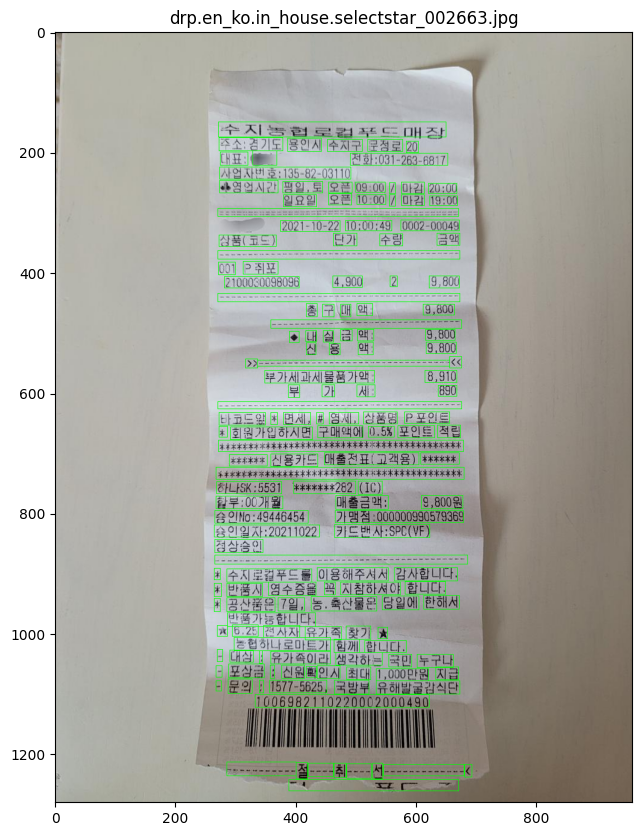

In [35]:
val_print_bbox(val_img_list[0])

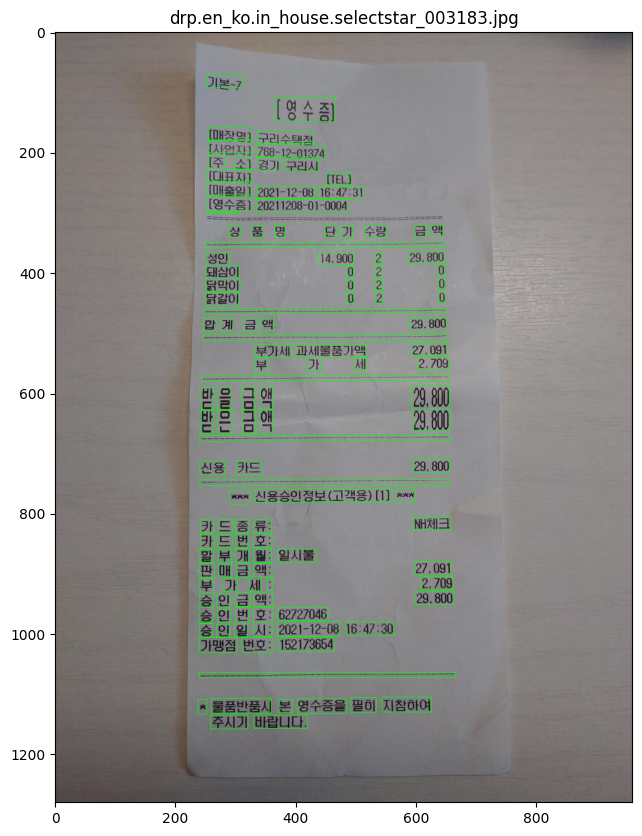

In [36]:
val_print_bbox(val_img_list[10])

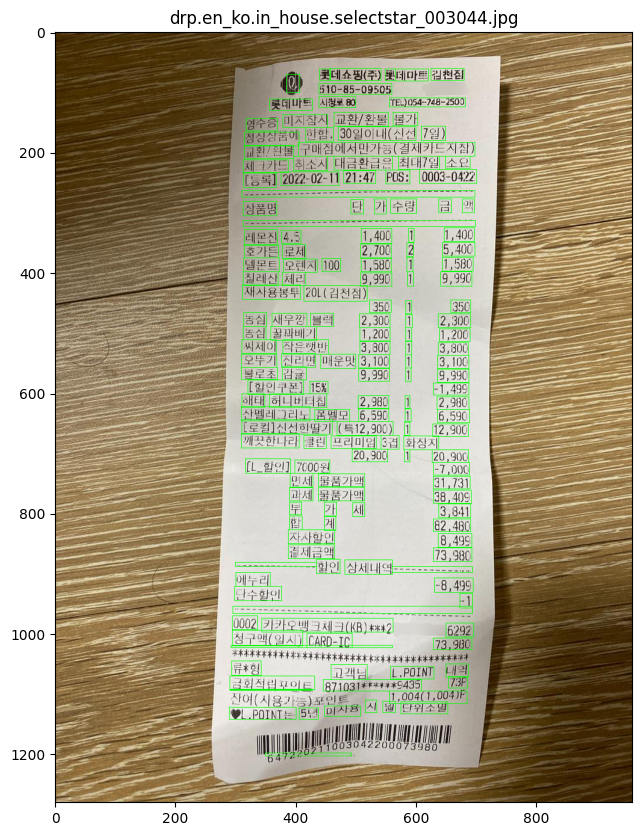

In [37]:
val_print_bbox(val_img_list[100])

# Test Image

In [38]:
test_img_list = glob.glob('/data/ephemeral/home/datasets/images/test/*.jpg')
len(test_img_list)

413

In [39]:
test_width_list = []
test_height_list = []
test_wh_rate_list = []

for img_path in val_img_list:
    img = Image.open(img_path)
    img = ImageOps.exif_transpose(img) # 이미지 회전을 원상복구
    width = img.size[0]
    height = img.size[1]
    wh_rate = height/width
    test_width_list.append(width)
    test_height_list.append(height)
    test_wh_rate_list.append(wh_rate)

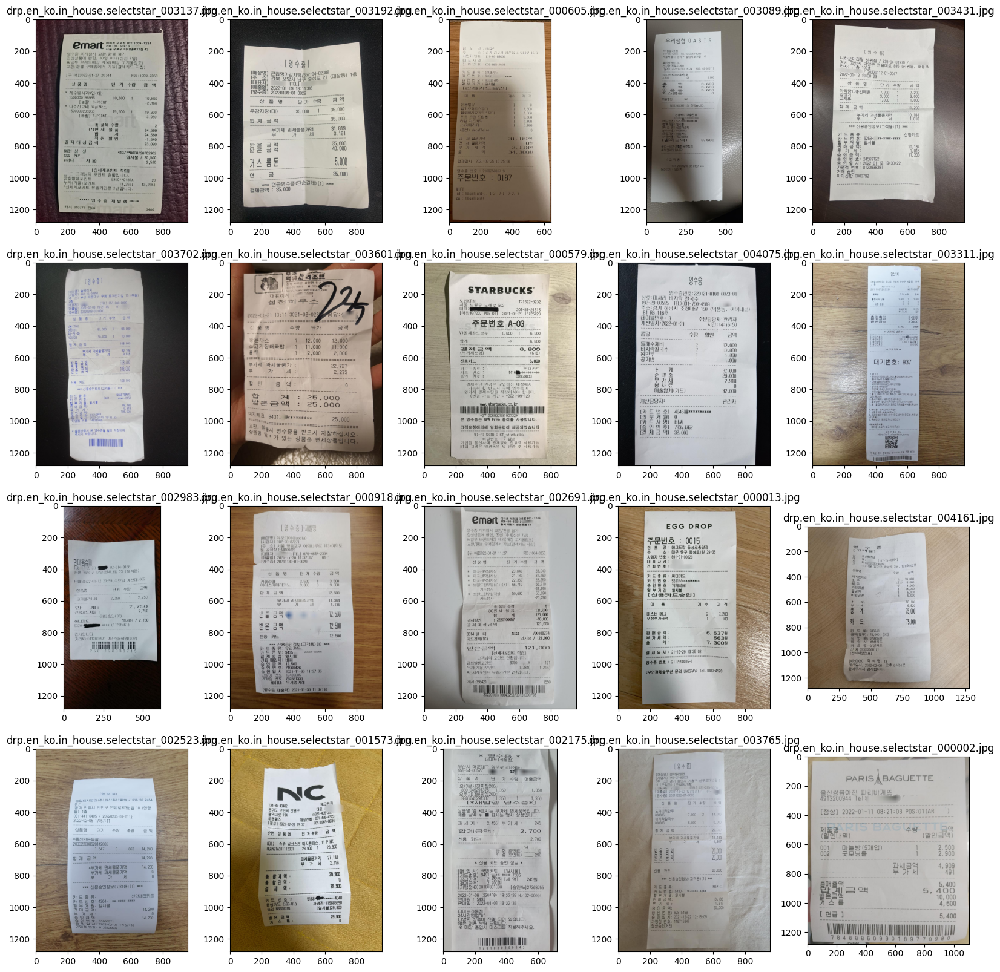

In [44]:
random.shuffle(test_img_list) # 매번 랜덤한 이미지 출력을 위해 셔플
plt.figure(figsize=(20, 20))

for i in range(20):
    ax = plt.subplot(4, 5, i+1)
    img_name = test_img_list[i].split('/')[-1]
    img = Image.open(test_img_list[i])
    img = ImageOps.exif_transpose(img) # 이미지 회전을 원상복구
    plt.imshow(img)
    plt.title(img_name)

In [42]:
w_counter = Counter(test_width_list)
print(w_counter)
h_counter = Counter(test_height_list)
print(h_counter)

Counter({960: 236, 720: 42, 1280: 23, 576: 8, 959: 8, 622: 5, 605: 3, 776: 2, 609: 2, 575: 2, 664: 2, 591: 2, 739: 2, 1012: 1, 1150: 1, 863: 1, 844: 1, 873: 1, 572: 1, 1010: 1, 578: 1, 700: 1, 715: 1, 806: 1, 633: 1, 684: 1, 627: 1, 542: 1, 770: 1, 423: 1, 466: 1, 595: 1, 980: 1, 862: 1, 662: 1, 431: 1, 917: 1, 737: 1, 766: 1, 569: 1, 557: 1, 782: 1, 1006: 1, 535: 1, 597: 1, 681: 1, 920: 1, 302: 1, 848: 1, 750: 1, 696: 1, 865: 1, 405: 1, 475: 1, 600: 1, 551: 1, 682: 1, 870: 1, 502: 1, 796: 1, 611: 1, 825: 1, 780: 1, 927: 1, 847: 1, 402: 1, 419: 1, 833: 1, 298: 1, 485: 1, 698: 1, 501: 1, 536: 1, 785: 1, 892: 1, 414: 1, 823: 1, 628: 1, 767: 1, 619: 1})
Counter({1280: 401, 1279: 1, 960: 1, 1101: 1})
